In [ ]:
!pip install torchinfo

import torch
from torchvision.models.detection import FasterRCNN, fasterrcnn_resnet50_fpn_v2
from torchvision.models.detection import FasterRCNN_ResNet50_FPN_V2_Weights
import torchvision.transforms as T
from torch.utils.data import Dataset
from torch.utils.data import random_split
from torchinfo import summary


import json
import random
from pathlib import Path
from collections import defaultdict
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt


device = "cuda" if torch.cuda.is_available() else "cpu"

print(f"Using {device} device")

Using cuda device


In [ ]:
# Initialize Faster R-CNN model without pre-trained weights
model = fasterrcnn_resnet50_fpn_v2(weights=None)

In [ ]:
NUM_CLASSES = 3

def get_faster_rcnn_model(num_classes):
    '''return model and preprocessing transform'''

    model = fasterrcnn_resnet50_fpn_v2(pretrained=True)

    '''
    This code replaces the classification layer's linear transformation with a new one. It changes the number of output classes to num_classes.
    This step is necessary because the original model might be pretrained on a dataset with a different number of classes.
    '''
    model.roi_heads.box_predictor.cls_score = torch.nn.Linear(
        in_features=model.roi_heads.box_predictor.cls_score.in_features,
        out_features=num_classes,
        bias=True,
    )

    '''
    Similar to the previous step, this code replaces the bounding box prediction layer's linear transformation with a new one.
    It adjusts the number of output features to accommodate the bounding box coordinates (4 values per class).
    '''
    model.roi_heads.box_predictor.bbox_pred = torch.nn.Linear(
        in_features=model.roi_heads.box_predictor.bbox_pred.in_features,
        out_features=num_classes * 4,
        bias=True,
    )

    '''
    preprocess = transforms.Compose([
        transforms.ToTensor(),
    ])
    '''

    preprocess = FasterRCNN_ResNet50_FPN_V2_Weights.DEFAULT.transforms()
    return model, preprocess

'''
This line calls the get_faster_rcnn_model function with NUM_CLASSES as the argument and assigns the returned
model and preprocessing transform to variables model and preprocess, respectively.
'''
model, preprocess = get_faster_rcnn_model(num_classes=NUM_CLASSES)
print(model.to(device))
print(model.transform)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_V2_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_v2_coco-dd69338a.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_v2_coco-dd69338a.pth
100%|██████████| 167M/167M [00:01<00:00, 88.5MB/s]


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
       

In [ ]:
class CocoDataset(Dataset):
    """PyTorch dataset for COCO annotations."""

    def __init__(self, root, annFile, transform=None):
        """Load COCO annotation data."""
        self.data_dir = Path(root)
        self.transform = transform

        # load the COCO annotations json
        anno_file_path = annFile
        with open(str(anno_file_path)) as file_obj:
            self.coco_data = json.load(file_obj)
        # put all of the annos into a dict where keys are image IDs to speed up retrieval
        self.image_id_to_annos = defaultdict(list)
        for anno in self.coco_data["annotations"]:
            image_id = anno["image_id"]
            self.image_id_to_annos[image_id] += [anno]

    def __len__(self):
        return len(self.coco_data["images"])

    def __getitem__(self, index):
        """Return tuple of image and labels as torch tensors."""
        image_data = self.coco_data["images"][index]
        image_id = image_data["id"]
        image_path = self.data_dir / image_data["file_name"]
        image = Image.open(image_path)

        annos = self.image_id_to_annos[image_id]
        anno_data = {
            "boxes": [],
            "labels": [],
            "area": [],
            "iscrowd": [],
        }
        for anno in annos:
            coco_bbox = anno["bbox"]
            left = coco_bbox[0]
            top = coco_bbox[1]
            right = coco_bbox[0] + coco_bbox[2]
            bottom = coco_bbox[1] + coco_bbox[3]
            area = coco_bbox[2] * coco_bbox[3]
            anno_data["boxes"].append([left, top, right, bottom])
            anno_data["labels"].append(anno["category_id"])
            anno_data["area"].append(area)
            anno_data["iscrowd"].append(anno["iscrowd"])

        target = {
            "boxes": torch.as_tensor(anno_data["boxes"], dtype=torch.float32),
            "labels": torch.as_tensor(anno_data["labels"], dtype=torch.int64),
            "image_id": torch.tensor([image_id]),
            "area": torch.as_tensor(anno_data["area"], dtype=torch.float32),
            "iscrowd": torch.as_tensor(anno_data["iscrowd"], dtype=torch.int64),
        }

        if self.transform is not None:
            image = self.transform(image)

        return image, target

In [ ]:
training_dataset = CocoDataset(
    root="/content/drive/MyDrive/WT/train/img/15",
    annFile="/content/drive/MyDrive/WT/train/anno/instances_default.json",
    transform=preprocess,
)

print(f"training dataset size: {training_dataset.__len__()}")

training dataset size: 387


Random training label: {'boxes': tensor([[   0.0000,  582.2000, 2736.2000, 2160.0000]]), 'labels': tensor([2]), 'image_id': tensor([99]), 'area': tensor([4317176.5000]), 'iscrowd': tensor([0])}


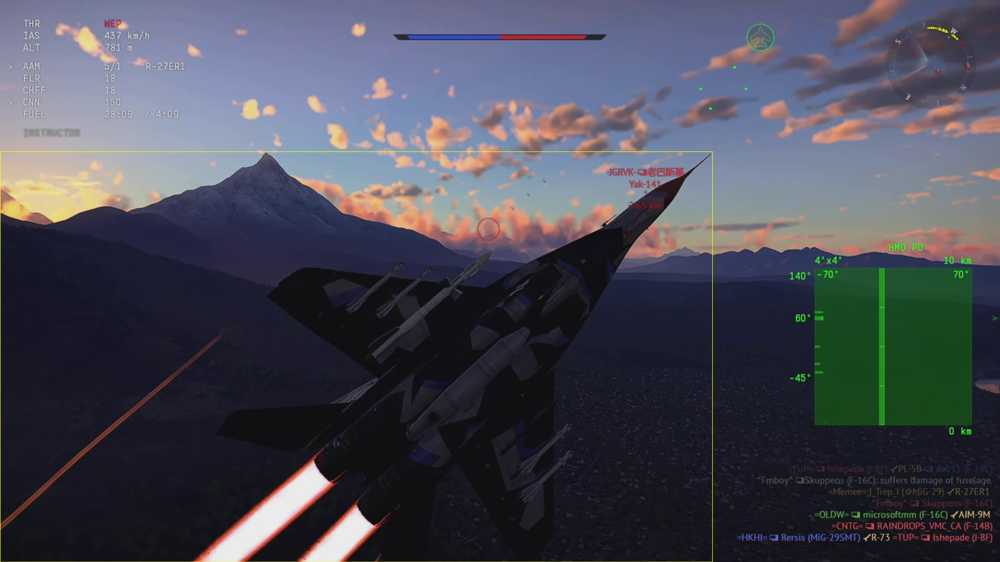

In [ ]:
# Get a random training sample
img, label = training_dataset[random.randint(0, len(training_dataset) - 1)]
print(f"Random training label: {label}")

# Display image with bbox labels
transform = T.ToPILImage()
img = transform(img)

# Convert the image to PIL format before drawing
draw = ImageDraw.Draw(img)

# Convert the tensor to numpy array to access the bounding boxes
boxes = label["boxes"].numpy()
labels = label["labels"].numpy()

# Define a color map for different classes
color_map = {
    0: "#0000ffcc",  # Blue for class 0 which is the needed background so irrevelant just for test
    1: "#add8e6",
    2: "#ffff00",
}

# Draw each bounding box with a different color based on its label
for bbox, label_id in zip(boxes, labels):
    x1, y1, x2, y2 = bbox
    color = color_map.get(label_id, "#ff0000cc")  # Default to red if label not found
    draw.rectangle([x1, y1, x2, y2], fill=None, outline=color, width=2)

# Display the image with bounding boxes
display(img)

In [ ]:
BATCH_SIZE = 1

def collate(batch):
    """return tuple data"""
    return tuple(zip(*batch))

train_loader = torch.utils.data.DataLoader(
    training_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=4,
    collate_fn=collate,
)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
# Split training dataset into training and validation subsets
train_size = int(0.8 * len(training_dataset))  # 80% for training
val_size = len(training_dataset) - train_size  # 20% for validation
train_dataset, val_dataset = random_split(training_dataset, [train_size, val_size])

# DataLoader for training subset
train_loader = torch.utils.data.DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=4,
    collate_fn=collate,
)

# DataLoader for validation subset
validation_loader = torch.utils.data.DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=4,
    collate_fn=collate,
)


X_val, y_val = next(iter(validation_loader))  # get a validation batch

model.eval()
with torch.no_grad():  # do not compute gradients
    X_val = [x.to(device) for x in X_val]
    out = model(X_val)  # model forward pass
    print(out)

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[{'boxes': tensor([[3.1147e+03, 9.0306e+01, 3.8400e+03, 1.8027e+03],
        [3.0381e+03, 1.2031e+03, 3.1194e+03, 1.2672e+03],
        [1.3686e+03, 1.0202e+03, 1.6468e+03, 1.2148e+03],
        [2.5866e+03, 9.3178e+01, 3.0563e+03, 4.0686e+02],
        [3.3339e+03, 0.0000e+00, 3.8400e+03, 7.0613e+02],
        [3.4547e+03, 4.0624e+02, 3.8400e+03, 5.3759e+02],
        [3.4705e+03, 8.6805e+01, 3.7522e+03, 4.4976e+02],
        [3.8025e+03, 1.2121e+03, 3.8346e+03, 1.2407e+03],
        [3.2731e+03, 1.2899e+02, 3.7520e+03, 3.9552e+02],
        [1.5157e+03, 1.2936e+02, 2.3371e+03, 1.7456e+02],
        [3.4392e+03, 2.4356e+02, 3.8258e+03, 5.6459e+02],
        [1.5101e+03, 1.1364e+02, 2.3611e+03, 2.0146e+02],
        [3.0660e+03, 3.8071e+02, 3.7948e+03, 5.7074e+02],
        [2.3482e+03, 0.0000e+00, 3.8400e+03, 6.6421e+02],
        [1.3209e+03, 1.0071e+03, 1.5369e+03, 1.1996e+03],
        [1.8643e+03, 8.3589e+02, 1.9552e+03, 9.2009e+02],
        [3.4805e+03, 0.0000e+00, 3.8400e+03, 1.1353e+03],
   

In [ ]:
params = [p for p in model.parameters() if p.requires_grad] # mayhaps redundant

optimizer = torch.optim.SGD(
    params,
    lr=0.00001,
    momentum=0.9,
    weight_decay=0.0001
)

In [ ]:
num_epochs = 100
train_loss_list = []
validation_loss_list = []
model.train()
for epoch in range(num_epochs):
    N = len(train_loader.dataset)
    current_train_loss = 0
    # train loop
    for images, targets in train_loader:
        images = list(image.to(device) for image in images)
        targets = [
            {
                k: v.to(device) if isinstance(v, torch.Tensor) else v
                for k, v in t.items()
            }
            for t in targets
        ]

        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())
        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        current_train_loss += losses
    train_loss_list.append(current_train_loss / N)


    # validation loop
    N = len(validation_loader.dataset)
    current_validation_loss = 0
    with torch.no_grad():
        for images, targets in validation_loader:
            images = list(image.to(device) for image in images)
            targets = [
                {
                    k: v.to(device) if isinstance(v, torch.Tensor) else v
                    for k, v in t.items()
                }
                for t in targets
            ]

            loss_dict = model(images, targets)
            losses = sum(loss for loss in loss_dict.values())
            current_validation_loss += losses
    validation_loss_list.append(current_validation_loss / N)

    print(f"epoch: {epoch}")
    print(
        f"train loss: {train_loss_list[-1]}, validation loss: {validation_loss_list[-1]}"
    )

epoch: 0
train loss: 0.7803523540496826, validation loss: 0.4547256529331207
epoch: 1
train loss: 0.38900765776634216, validation loss: 0.3596944510936737
epoch: 2
train loss: 0.3202741742134094, validation loss: 0.3351882994174957
epoch: 3
train loss: 0.29549169540405273, validation loss: 0.3232664167881012
epoch: 4
train loss: 0.27836576104164124, validation loss: 0.3127194941043854
epoch: 5
train loss: 0.26944035291671753, validation loss: 0.3042013645172119
epoch: 6
train loss: 0.2608354091644287, validation loss: 0.296590656042099
epoch: 7
train loss: 0.25690463185310364, validation loss: 0.2904810607433319
epoch: 8
train loss: 0.2507975101470947, validation loss: 0.28982308506965637
epoch: 9
train loss: 0.24645885825157166, validation loss: 0.28384891152381897
epoch: 10
train loss: 0.24174249172210693, validation loss: 0.27705928683280945
epoch: 11
train loss: 0.23647592961788177, validation loss: 0.2735121250152588
epoch: 12
train loss: 0.23260392248630524, validation loss: 0.27

In [ ]:
summary(model=model,
        # col_names=["input_size"], # uncomment for smaller output
        col_names=["num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                            Param #              Trainable
FasterRCNN (FasterRCNN)                            --                   Partial
├─GeneralizedRCNNTransform (transform)             --                   --
├─BackboneWithFPN (backbone)                       --                   Partial
│    └─IntermediateLayerGetter (body)              --                   Partial
│    │    └─Conv2d (conv1)                         (9,408)              False
│    │    └─BatchNorm2d (bn1)                      (128)                False
│    │    └─ReLU (relu)                            --                   --
│    │    └─MaxPool2d (maxpool)                    --                   --
│    │    └─Sequential (layer1)                    (215,808)            False
│    │    └─Sequential (layer2)                    1,219,584            True
│    │    └─Sequential (layer3)                    7,098,368            True
│    │    └─Sequential (layer4)                    14,964,736    

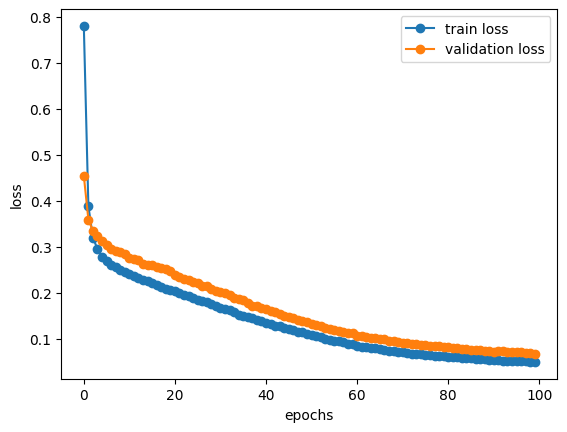

In [ ]:
# SAVE DO NOT RUN AND EITHER ACTUALLY SAVE DOWN THE MODEL OR CHANGE THE PATH FUCK IT!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!

torch.save(model, "/content/WTUNmodel")
torch.save(model, "/content/drive/MyDrive/WTUNmodel")

# plot losses
train_loss = [x.cpu().detach().numpy() for x in train_loss_list]
validation_loss = [x.cpu().detach().numpy() for x in validation_loss_list]

plt.plot(train_loss, "-o", label="train loss")
plt.plot(validation_loss, "-o", label="validation loss")
plt.xlabel("epochs")
plt.ylabel("loss")
plt.legend()

In [ ]:
model = torch.load("/content/WTUNmodel")

In [ ]:
def inference(img, device, model):
    # Convert PIL Image to PyTorch tensor
    transform = T.ToTensor()
    img_tensor = transform(img).unsqueeze(0).to(device)

    model.eval()
    with torch.no_grad():
        pred = model(img_tensor)  # Forward pass

    # Display image with bbox
    img_pil = T.ToPILImage()(img_tensor.squeeze(0).cpu())  # Convert tensor back to PIL Image
    draw = ImageDraw.Draw(img_pil)

    color_map = {
        0: "#0000ffcc",  # Blue for class 0 which is the needed background so irrelevant just for test
        1: "#add8e6",
        2: "#ffff00",
    }

    # Iterate over each detected object and draw bounding box with respective color
    for bbox, label in zip(pred[0]["boxes"], pred[0]["labels"]):
        x1, y1, x2, y2 = bbox.cpu().detach().numpy()
        color = color_map.get(label.item(), "#ff0000cc")  # Default to red if label not found in color map
        draw.rectangle([x1, y1, x2, y2], fill=None, outline=color, width=2)

    # Display the image with all bounding boxes drawn
    display(img_pil)

    return pred

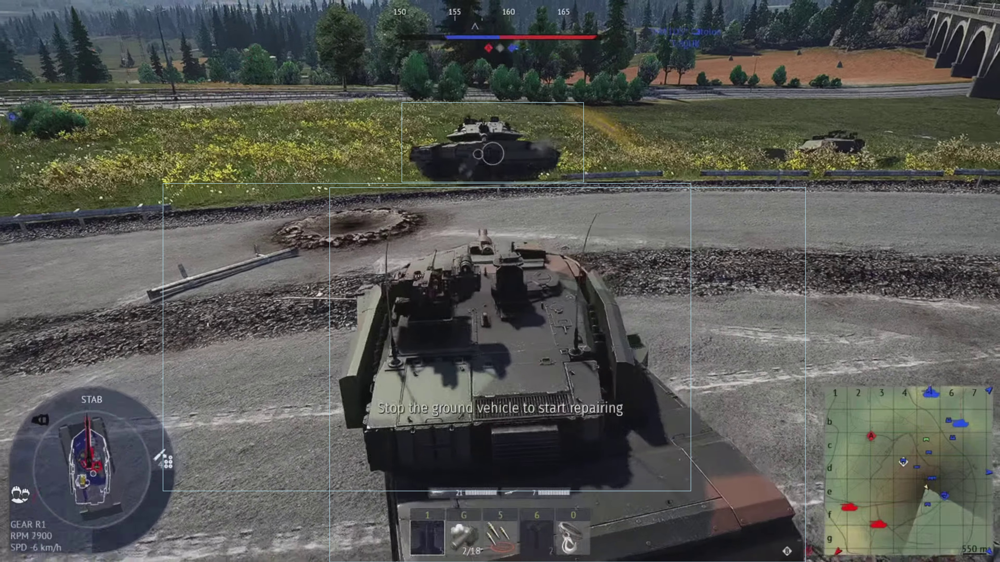

[{'boxes': tensor([[1265.4047,  720.8941, 3093.7048, 2160.0000],
          [1542.5624,  393.2742, 2241.4133,  700.7257],
          [ 625.0912,  704.9294, 2653.3184, 1887.8418]], device='cuda:0'),
  'labels': tensor([1, 1, 1], device='cuda:0'),
  'scores': tensor([0.9689, 0.6672, 0.1237], device='cuda:0')}]

In [ ]:
custom_image_path = "/content/frame_015589.jpg"
custom_image = Image.open(custom_image_path)

inference(custom_image, device, model)